In [1]:
import numpy as np
import h5py

f = h5py.File("/oak/stanford/groups/akundaje/avsec/basepair/data/"
              +"processed/comparison/output/nexus,peaks,OSNK,0,10"
              +",1,FALSE,same,0.5,64,25,0.004,9,FALSE,[1,50],TRUE"
              +",FALSE,1/deeplift.imp_score.h5", "r")
#f = h5py.File("/users/avanti/deeplift.imp_score.h5","r")
nanog_mask = np.array(f['metadata']['interval_from_task'][:]=='Nanog')
nanog_profile_wn_hypimp = np.array(f["hyp_imp/Nanog/profile/wn"][:])[nanog_mask]
onehot_seq = np.array(f["inputs/seq"][:])[nanog_mask]
nanog_profile_wn_contribs = nanog_profile_wn_hypimp*onehot_seq

In [2]:
import modisco
track_set = modisco.tfmodisco_workflow.workflow.prep_track_set(
    task_names=["Nanog_profile_wn"],
    contrib_scores={'Nanog_profile_wn': nanog_profile_wn_contribs},
    hypothetical_contribs={'Nanog_profile_wn': nanog_profile_wn_hypimp},
    one_hot=onehot_seq)
grp = h5py.File("/oak/stanford/groups/akundaje/avsec/basepair/data/processed/comparison/output/nexus"
                +",peaks,OSNK,0,10,1,FALSE,same,0.5,64,25,0.004,9,FALSE,[1,50],TRUE,FALSE,1/deeplift"
                +"/Nanog/out/profile/wn/modisco.h5","r")
loaded_tfmodisco_results =\
    modisco.tfmodisco_workflow.workflow.TfModiscoResults.from_hdf5(grp, track_set=track_set)
grp.close()
patterns = (loaded_tfmodisco_results
            .metacluster_idx_to_submetacluster_results["metacluster_0"]
            .seqlets_to_patterns_result.patterns)

TF-MoDISco is using the TensorFlow backend.
/users/avanti/anaconda3/envs/py376/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/users/avanti/anaconda3/envs/py376/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/users/avanti/anaconda3/envs/py376/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/u

In [3]:
len(loaded_tfmodisco_results.multitask_seqlet_creation_results.final_seqlets)

98300

In [4]:
nanog_profile_wn_contribs.shape

(55233, 1000, 4)

In [5]:
#Saving the seqlets

"""extracted_contrib_scores = []
extracted_hypothetical_scores = []
extracted_onehot_seqs = []
seqlets_list = loaded_tfmodisco_results.multitask_seqlet_creation_results.final_seqlets

window_around = 50

#extract +/- 50bp around each seqlet
for seqlet in seqlets_list:
    example_idx = seqlet.coor.example_idx
    start = seqlet.coor.start
    end = seqlet.coor.end
    if ((start>=window_around) and (end<=1000-window_around)):
        extracted_contrib_scores.append(
            nanog_profile_wn_contribs[example_idx,start-window_around:end+window_around])
        extracted_hypothetical_scores.append(
            nanog_profile_wn_hypimp[example_idx,start-window_around:end+window_around])
        extracted_onehot_seqs.append(
            onehot_seq[example_idx,start-window_around:end+window_around])

np.save("extracted_contrib_scores.npy", np.array(extracted_contrib_scores))
np.save("extracted_hypothetical_scores.npy", np.array(extracted_hypothetical_scores))
np.save("extracted_onehot.npy", np.array(extracted_onehot_seqs))"""

'extracted_contrib_scores = []\nextracted_hypothetical_scores = []\nextracted_onehot_seqs = []\nseqlets_list = loaded_tfmodisco_results.multitask_seqlet_creation_results.final_seqlets\n\nwindow_around = 50\n\n#extract +/- 50bp around each seqlet\nfor seqlet in seqlets_list:\n    example_idx = seqlet.coor.example_idx\n    start = seqlet.coor.start\n    end = seqlet.coor.end\n    if ((start>=window_around) and (end<=1000-window_around)):\n        extracted_contrib_scores.append(\n            nanog_profile_wn_contribs[example_idx,start-window_around:end+window_around])\n        extracted_hypothetical_scores.append(\n            nanog_profile_wn_hypimp[example_idx,start-window_around:end+window_around])\n        extracted_onehot_seqs.append(\n            onehot_seq[example_idx,start-window_around:end+window_around])\n\nnp.save("extracted_contrib_scores.npy", np.array(extracted_contrib_scores))\nnp.save("extracted_hypothetical_scores.npy", np.array(extracted_hypothetical_scores))\nnp.save("

In [6]:
!ls

commit0975f52_l6g2m0_results.hdf5  presparserun_results.hdf5
commitb86c5a_l6g2m0_results.hdf5   runme.sh
copy_data.py			   sparserun_l6g2m0_results.hdf5
extracted_contrib_scores.npy	   sparserun_results.hdf5
extracted_hypothetical_scores.npy  trial1.deeplift.imp_score.h5
extracted_onehot.npy		   trial1.modisco.h5
myrun_results.hdf5		   TryBpNet.ipynb
presparserun_l8g3m2_results.hdf5   TryBpNet-MEMEinit.ipynb


In [7]:
#for i in range(10):
#    seqlets_list = loaded_tfmodisco_results.multitask_seqlet_creation_results.final_seqlets
#    modisco.visualization.viz_sequence.plot_weights(seqlets_list[i]["Nanog_profile_wn_contrib_scores"].fwd)

In [8]:
"""#visualize the patterns:
%matplotlib inline
from modisco.visualization import viz_sequence
for idx,pattern in enumerate(patterns):
    print("pattern idx",idx)
    print(len(pattern.seqlets))
    viz_sequence.plot_weights(
        pattern["Nanog_profile_wn_contrib_scores"].fwd)
    viz_sequence.plot_weights(pattern["sequence"].fwd)"""

'#visualize the patterns:\n%matplotlib inline\nfrom modisco.visualization import viz_sequence\nfor idx,pattern in enumerate(patterns):\n    print("pattern idx",idx)\n    print(len(pattern.seqlets))\n    viz_sequence.plot_weights(\n        pattern["Nanog_profile_wn_contrib_scores"].fwd)\n    viz_sequence.plot_weights(pattern["sequence"].fwd)'

/mnt/lab_data2/avanti/tfmodisco
commit 8911816e81a85e738e9714d4f63abc4f04e87519 (HEAD -> cluster_init, origin/cluster_init)
Author: Av Shrikumar <avanti.shrikumar@gmail.com>
Date:   Thu Apr 16 04:11:49 2020 -0700

    With Leiden instead of Louvain
/mnt/lab_data2/avanti/tfmodisco_bio_experiments/bpnet/trial1
MEMORY 4.398927872
On task Nanog_profile_wn
Computing windowed sums on original
Generating null dist
peak(mu)= 0.00754788601747714
Computing threshold
Thresholds from null dist were -0.026598811149597168  and  0.2509317398071289
Passing windows frac was 0.04676685078463518 , which is above  0.03 ; adjusting
Final raw thresholds are -0.3184376752376554  and  0.3184376752376554
Final transformed thresholds are -0.9699999852203116  and  0.9699999852203116


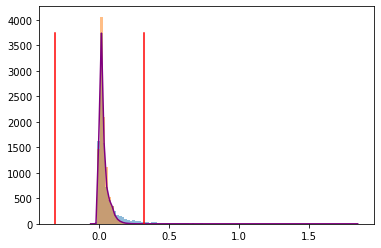

Got 98300 coords
After resolving overlaps, got 98300 seqlets
Across all tasks, the weakest transformed threshold used was: 0.9698999852203116
MEMORY 6.304600064
98300 identified in total
1 activity patterns with support >= 2000 out of 3 possible patterns
Metacluster sizes:  [98297]
Idx to activities:  {0: '1'}
MEMORY 6.30546432
On metacluster 0
Metacluster size 98297 limited to 50000
Relevant tasks:  ('Nanog_profile_wn',)
Relevant signs:  (1,)

TfModiscoSeqletsToPatternsFactory: seed=1234
9953
Running MEME
Command: /software/meme/5.0.1/bin/meme meme_out/metacluster0/inp_seqlets.fa -dna -mod anr -nmotifs 20 -minw 6 -maxw 50 -oc meme_out/metacluster0
Duration of MEME: 5528.169981956482 seconds
Skipping motif ATTWGCAT as e-value 4.6 does not meet threshold of 0.05
Skipping motif CTTTATTTTACAAATTAARRTGGGAAKCAGGTTTACAGGAA as e-value 16.0 does not meet threshold of 0.05
Skipping motif TTCCTBCCTAGATSACTYTAWTRTTSAGCCACTGYTGCTGT as e-value 25.0 does not meet threshold of 0.05
Of 50000 seqlets, 

  0%|          | 0/50 [00:00<?, ?it/s]

Quality: 0.7929953078705797


 64%|██████▍   | 32/50 [08:38<04:55, 16.41s/it]

Quality: 0.7930393016146182


 68%|██████▊   | 34/50 [09:18<04:54, 18.43s/it]

Quality: 0.7930597268345048


100%|██████████| 50/50 [13:51<00:00, 16.64s/it]

Got 36 clusters after round 1
Counts:
{8: 1141, 11: 739, 20: 108, 6: 1314, 1: 2052, 3: 1768, 7: 1241, 0: 2811, 16: 291, 4: 1656, 2: 1983, 33: 12, 12: 582, 5: 1378, 10: 832, 13: 534, 21: 80, 29: 27, 9: 972, 14: 499, 17: 287, 18: 191, 25: 43, 19: 111, 30: 18, 26: 39, 22: 67, 15: 447, 24: 51, 23: 59, 31: 16, 28: 29, 32: 16, 34: 7, 27: 34, 35: 4}
MEMORY 9.486700544
(Round 1) Aggregating seqlets in each cluster
MEMORY 9.48652032
Aggregating for cluster 0 with 2811 seqlets
MEMORY 9.48652032


Trimmed 112 out of 2811
Aggregating for cluster 1 with 2052 seqlets
MEMORY 9.50083584
Trimmed 85 out of 2052
Skipped 1 seqlets
Aggregating for cluster 2 with 1983 seqlets
MEMORY 9.460273152
Trimmed 107 out of 1983
Aggregating for cluster 3 with 1768 seqlets
MEMORY 9.464733696
Trimmed 63 out of 1768
Aggregating for cluster 4 with 1656 seqlets
MEMORY 9.467932672
Trimmed 59 out of 1656
Aggregating for cluster 5 with 1378 seqlets
MEMORY 9.472311296
Trimmed 68 out of 1378
Aggregating for cluster 6 with 1314 seqlets
MEMORY 9.474514944
Trimmed 104 out of 1314
Aggregating for cluster 7 with 1241 seqlets
MEMORY 9.4770176
Trimmed 116 out of 1241
Aggregating for cluster 8 with 1141 seqlets
MEMORY 9.479647232
Trimmed 102 out of 1141
Skipped 1 seqlets
Aggregating for cluster 9 with 972 seqlets
MEMORY 9.480675328
Trimmed 54 out of 972
Aggregating for cluster 10 with 832 seqlets
MEMORY 9.483558912
Trimmed 146 out of 832
Skipped 1 seqlets
Aggregating for cluster 11 with 739 seqlets
MEMORY 9.484288
Tri

  0%|          | 0/50 [00:00<?, ?it/s]

Quality: 0.7570619846939575


  2%|▏         | 1/50 [00:18<14:54, 18.25s/it]

Quality: 0.7595561674658683


  4%|▍         | 2/50 [00:37<14:45, 18.45s/it]

Quality: 0.7605872687982466


 16%|█▌        | 8/50 [02:04<10:41, 15.28s/it]

Quality: 0.7607545635889272


 20%|██        | 10/50 [02:32<09:54, 14.85s/it]

Quality: 0.7609717550034025


 58%|█████▊    | 29/50 [07:02<05:12, 14.87s/it]

Quality: 0.7610518922133434


100%|██████████| 50/50 [12:20<00:00, 14.80s/it]

Got 39 clusters after round 2
Counts:
{15: 282, 1: 2614, 11: 447, 5: 1160, 7: 1061, 0: 3137, 19: 151, 2: 1673, 10: 484, 6: 1094, 8: 826, 29: 73, 31: 51, 35: 31, 33: 46, 14: 316, 30: 51, 9: 597, 3: 1616, 22: 117, 26: 79, 13: 345, 4: 1372, 20: 133, 25: 84, 27: 79, 12: 395, 28: 76, 18: 193, 16: 250, 17: 247, 21: 119, 24: 94, 36: 27, 34: 37, 32: 48, 23: 111, 37: 15, 38: 8}
MEMORY 8.337211392
(Round 2) Aggregating seqlets in each cluster
MEMORY 8.3369984
Aggregating for cluster 0 with 3137 seqlets
MEMORY 8.3369984


Trimmed 344 out of 3137
Removed 7 duplicate seqlets
Aggregating for cluster 1 with 2614 seqlets
MEMORY 8.350081024
Trimmed 184 out of 2614
Aggregating for cluster 2 with 1673 seqlets
MEMORY 8.357154816
Trimmed 125 out of 1673
Removed 4 duplicate seqlets
Aggregating for cluster 3 with 1616 seqlets
MEMORY 8.357183488
Trimmed 175 out of 1616
Aggregating for cluster 4 with 1372 seqlets
MEMORY 8.357183488
Trimmed 121 out of 1372
Aggregating for cluster 5 with 1160 seqlets
MEMORY 8.358985728
Trimmed 108 out of 1160
Skipped 1 seqlets
Aggregating for cluster 6 with 1094 seqlets
MEMORY 8.361517056
Trimmed 194 out of 1094
Aggregating for cluster 7 with 1061 seqlets
MEMORY 8.3628032
Trimmed 153 out of 1061
Removed 1 duplicate seqlets
Aggregating for cluster 8 with 826 seqlets
MEMORY 8.365027328
Trimmed 109 out of 826
Removed 2 duplicate seqlets
Aggregating for cluster 9 with 597 seqlets
MEMORY 8.366743552
Trimmed 139 out of 597
Aggregating for cluster 10 with 484 seqlets
MEMORY 8.366829568
Trimme

After 1 runs, maximum modularity is Q = 0.00993784
After 3 runs, maximum modularity is Q = 0.00993788
After 5 runs, maximum modularity is Q = 0.00994274
Louvain completed 25 runs in 8.250941038131714 seconds
Similarity is 0.7008663; is_dissimilar is True
Inspecting for spurious merging
Wrote graph to binary file in 0.04961133003234863 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.00275485
After 2 runs, maximum modularity is Q = 0.00288034
After 3 runs, maximum modularity is Q = 0.00288639
After 4 runs, maximum modularity is Q = 0.00303071
After 14 runs, maximum modularity is Q = 0.00303477
Louvain completed 34 runs in 11.155139684677124 seconds
Similarity is 0.9373054; is_dissimilar is False
Inspecting for spurious merging
Wrote graph to binary file in 0.031062841415405273 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.00233425
After 2 runs, maximum modularity is Q = 0.0206487
Louvain completed 22 ru

Discarded 10 seqlets
Removed 1 duplicate seqlets
Removed 2 duplicate seqlets
Skipped 1 seqlets
Removed 2 duplicate seqlets
Removed 1 duplicate seqlets
Removed 3 duplicate seqlets
Got 22 patterns after reassignment
MEMORY 8.320733184
Total time taken is 6919.19s
MEMORY 8.320733184


In [9]:
#print modisco commit hash
%cd /users/avanti/tfmodisco
!git log -n 1
%cd /users/avanti/tfmodisco_bio_experiments/bpnet/trial1

from importlib import reload

%matplotlib inline
import h5py
import numpy as np
import modisco
import modisco.cluster.phenograph.core
reload(modisco.cluster.phenograph.core)
import modisco.cluster.phenograph.cluster
reload(modisco.cluster.phenograph.cluster)
import modisco.cluster.phenograph
reload(modisco.cluster.phenograph)
import modisco.cluster.core
reload(modisco.cluster.core)
import modisco.cluster
reload(modisco.cluster)
import modisco.affinitymat.core
reload(modisco.affinitymat.core)
import modisco.affinitymat.transformers
reload(modisco.affinitymat.transformers)
import modisco.tfmodisco_workflow.seqlets_to_patterns
reload(modisco.tfmodisco_workflow.seqlets_to_patterns)
import modisco.tfmodisco_workflow.workflow
reload(modisco.tfmodisco_workflow.workflow)
import modisco.nearest_neighbors
reload(modisco.nearest_neighbors)
import modisco.affinitymat
reload(modisco.affinitymat)
import modisco.aggregator
reload(modisco.aggregator)
import modisco.value_provider
reload(modisco.value_provider)
import modisco.core
reload(modisco.core)
import modisco.coordproducers
reload(modisco.coordproducers)
import modisco.metaclusterers
reload(modisco.metaclusterers)
import modisco.clusterinit.memeinit
reload(modisco.clusterinit.memeinit)

%matplotlib inline

workflow = modisco.tfmodisco_workflow.workflow.TfModiscoWorkflow(
    sliding_window_size=21,
    flank_size=10,
    target_seqlet_fdr=0.01,
    min_passing_windows_frac=0.03,
    max_passing_windows_frac=0.03,
    min_metacluster_size=2000,
    min_metacluster_size_frac=0.02,
    max_seqlets_per_metacluster=50000,
    seqlets_to_patterns_factory=
      modisco.tfmodisco_workflow.seqlets_to_patterns.TfModiscoSeqletsToPatternsFactory(
        initclusterer_factory=modisco.clusterinit.memeinit.MemeInitClustererFactory(    
                        meme_command="/software/meme/5.0.1/bin/meme",
                        base_outdir="meme_out",            
                        num_seqlets_to_use=10000,
                        nmotifs=20, n_jobs=4),
        use_louvain=False,
        trim_to_window_size=30,
        initial_flank_to_add=10,
        kmer_len=6,
        num_gaps=2,
        num_mismatches=0,
        n_cores=10,
        final_min_cluster_size=60
    )
)

results = workflow(
    task_names=["Nanog_profile_wn"],
    contrib_scores={'Nanog_profile_wn': nanog_profile_wn_contribs},
    hypothetical_contribs={'Nanog_profile_wn': nanog_profile_wn_hypimp},
    one_hot=onehot_seq)

In [10]:
import h5py
import modisco.util
reload(modisco.util)
import os

file_path = "commit891181_memeinit_l6g2m0_results.hdf5"
if (os.path.exists(file_path)):
    os.remove(file_path)
grp = h5py.File(file_path, "w")
results.save_hdf5(grp)
grp.close()

metacluster_0
activity pattern: [1]
metacluster_0 pattern_0
total seqlets: 3581
Task 0 hypothetical scores:


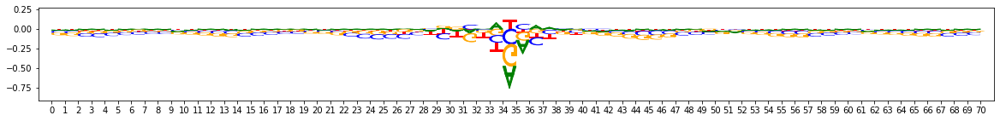

Task 0 actual importance scores:


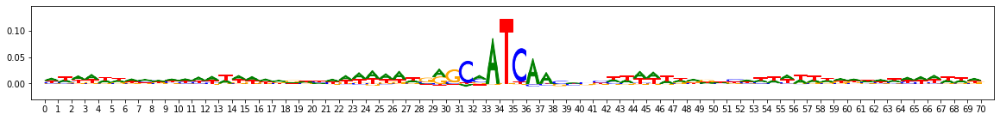

onehot, fwd and rev:


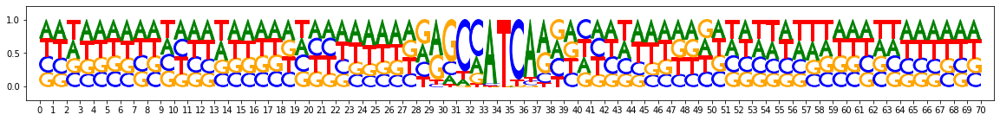

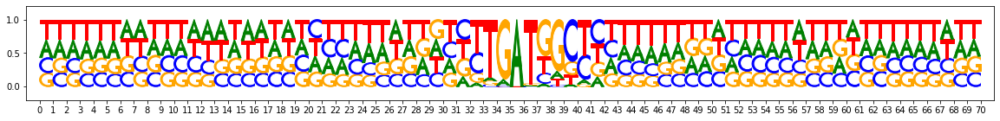

metacluster_0 pattern_1
total seqlets: 2469
Task 0 hypothetical scores:


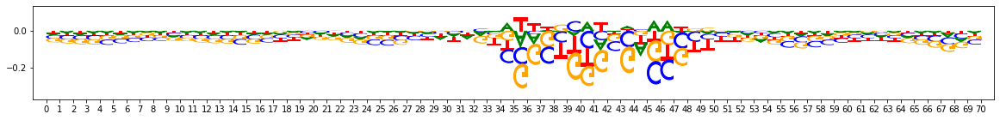

Task 0 actual importance scores:


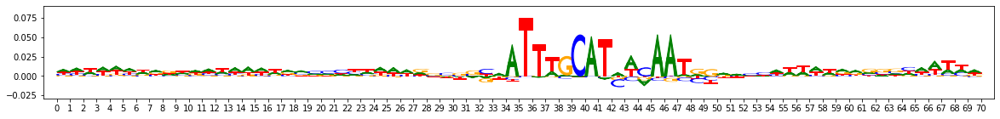

onehot, fwd and rev:


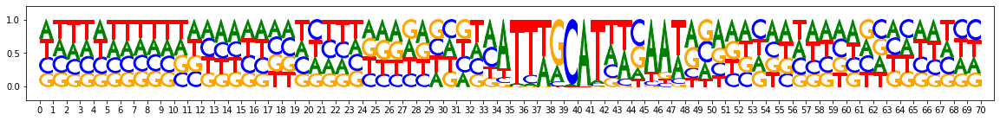

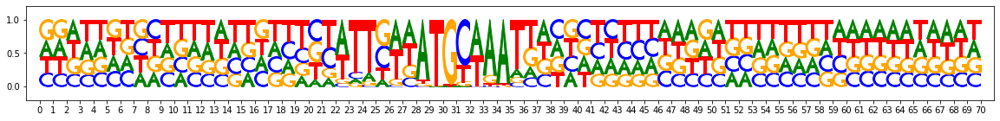

metacluster_0 pattern_2
total seqlets: 1552
Task 0 hypothetical scores:


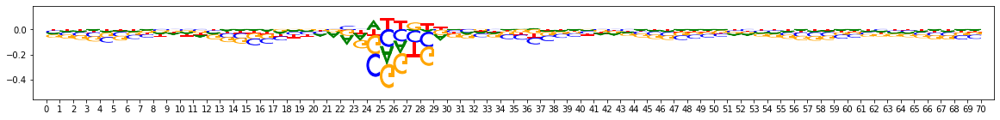

Task 0 actual importance scores:


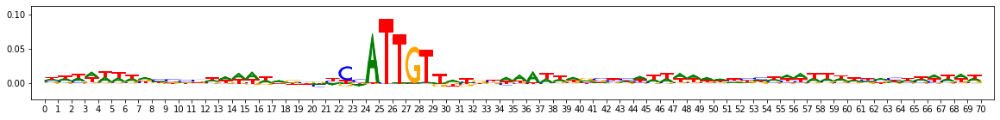

onehot, fwd and rev:


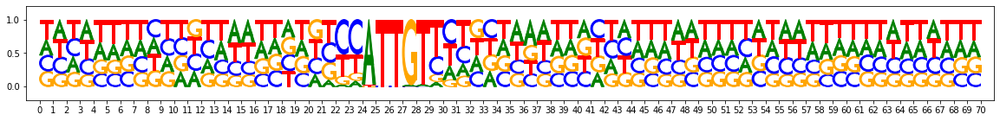

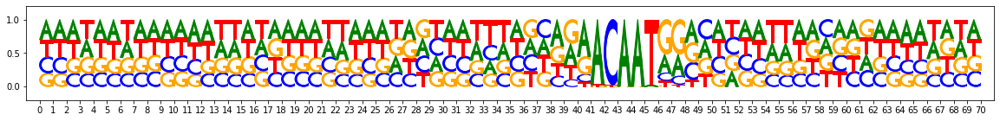

metacluster_0 pattern_3
total seqlets: 1529
Task 0 hypothetical scores:


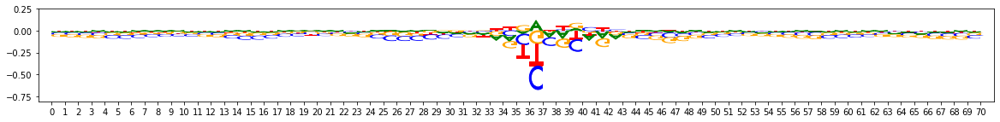

Task 0 actual importance scores:


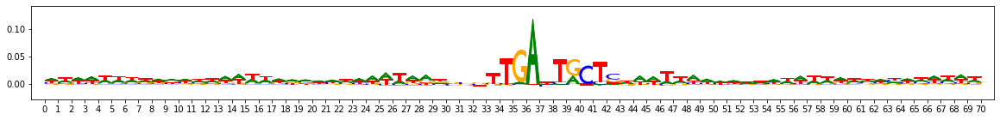

onehot, fwd and rev:


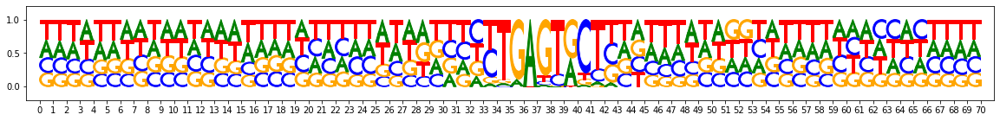

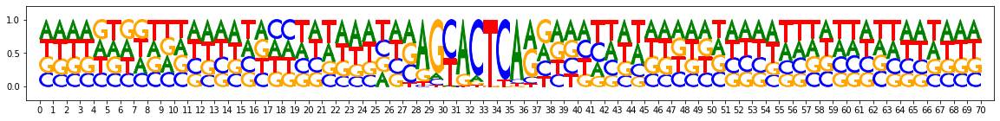

metacluster_0 pattern_4
total seqlets: 1272
Task 0 hypothetical scores:


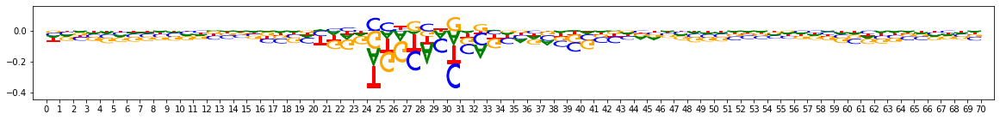

Task 0 actual importance scores:


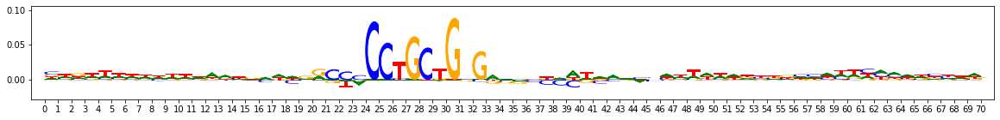

onehot, fwd and rev:


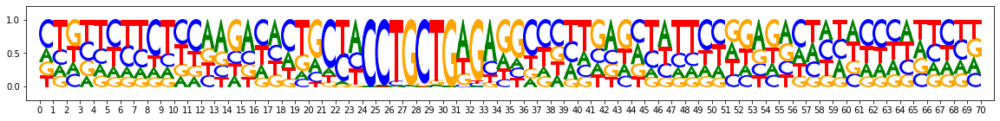

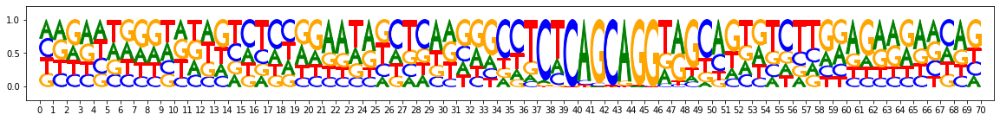

metacluster_0 pattern_5
total seqlets: 1102
Task 0 hypothetical scores:


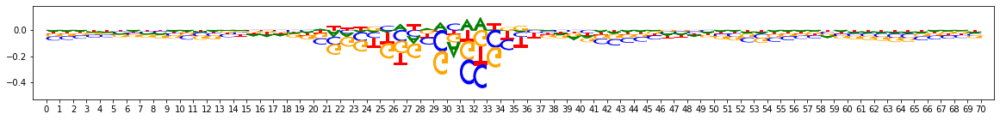

Task 0 actual importance scores:


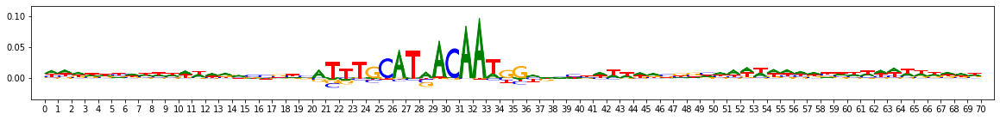

onehot, fwd and rev:


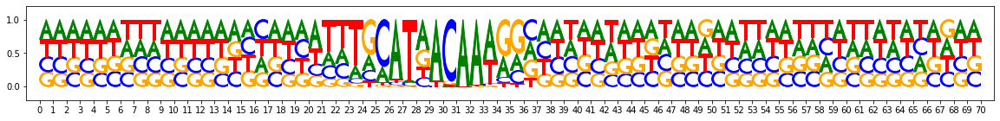

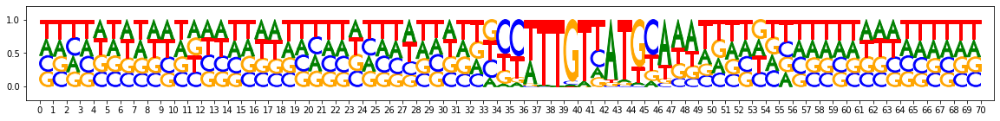

metacluster_0 pattern_6
total seqlets: 916
Task 0 hypothetical scores:


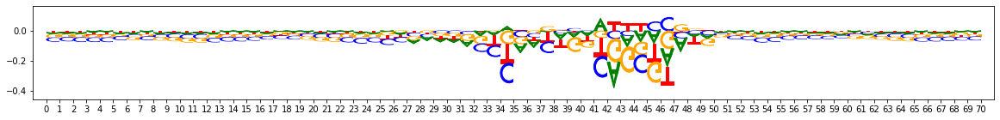

Task 0 actual importance scores:


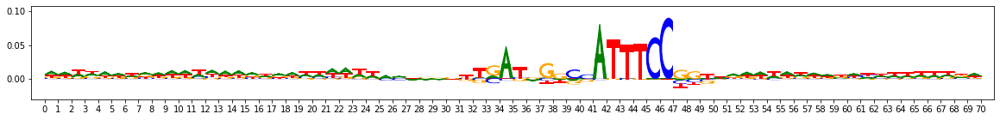

onehot, fwd and rev:


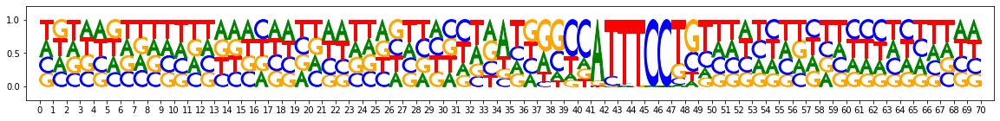

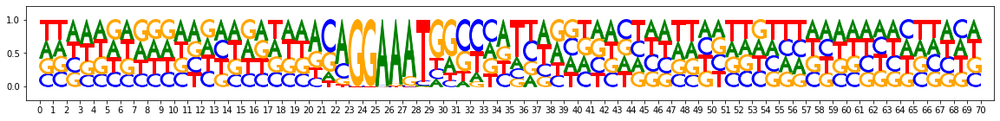

metacluster_0 pattern_7
total seqlets: 922
Task 0 hypothetical scores:


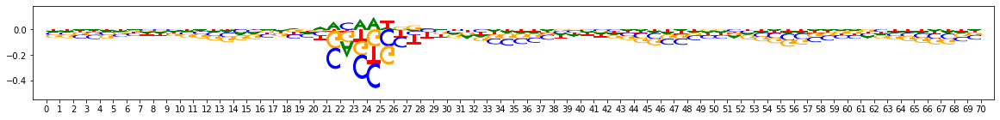

Task 0 actual importance scores:


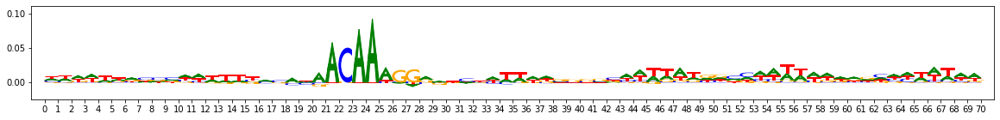

onehot, fwd and rev:


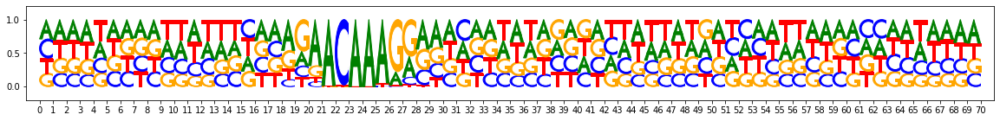

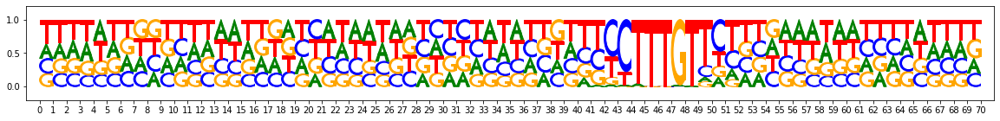

metacluster_0 pattern_8
total seqlets: 747
Task 0 hypothetical scores:


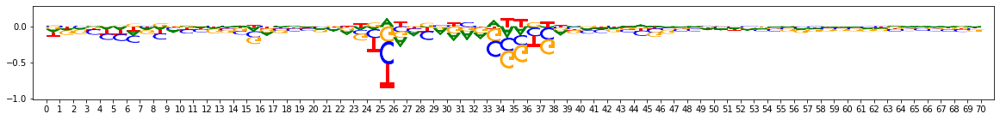

Task 0 actual importance scores:


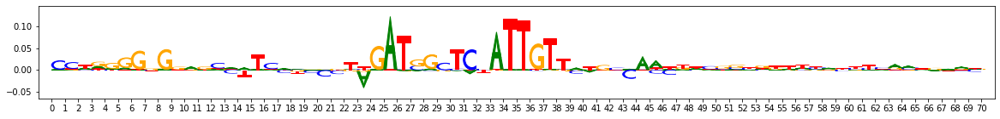

onehot, fwd and rev:


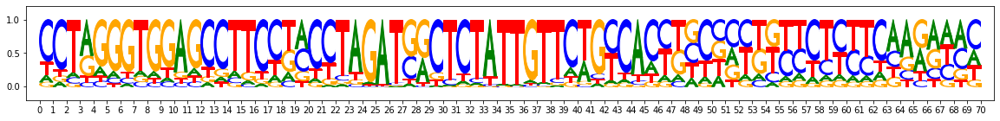

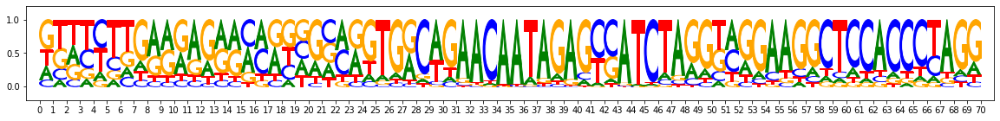

metacluster_0 pattern_9
total seqlets: 496
Task 0 hypothetical scores:


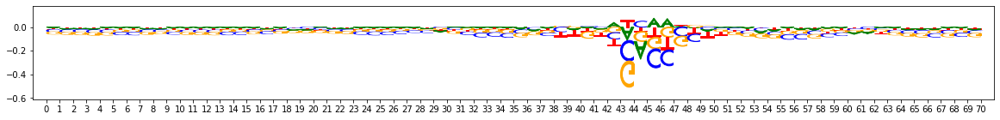

Task 0 actual importance scores:


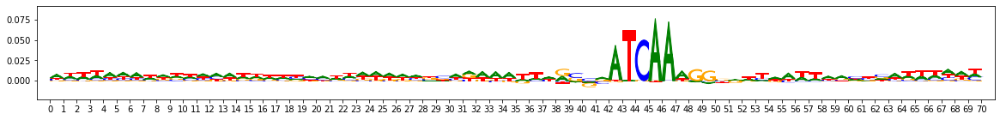

onehot, fwd and rev:


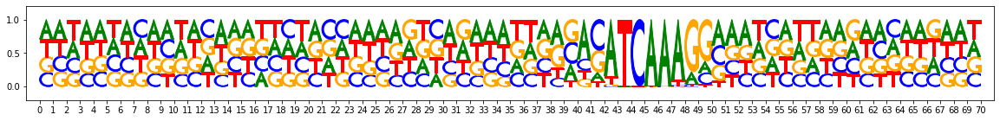

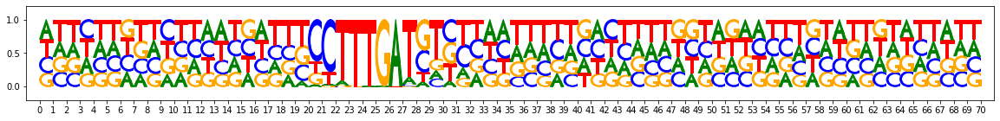

metacluster_0 pattern_10
total seqlets: 452
Task 0 hypothetical scores:


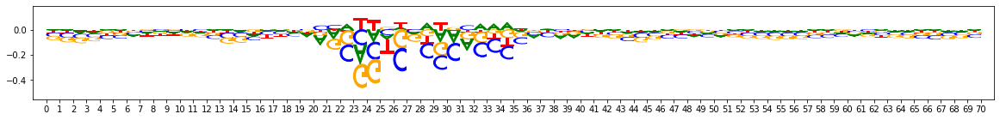

Task 0 actual importance scores:


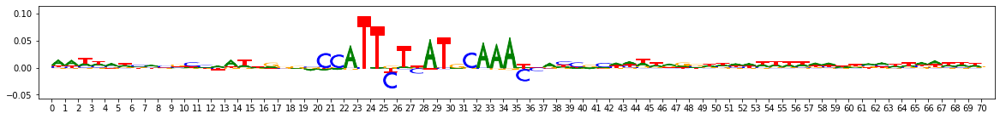

onehot, fwd and rev:


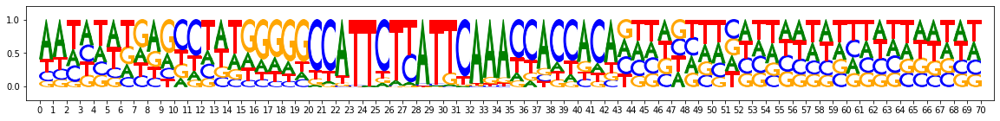

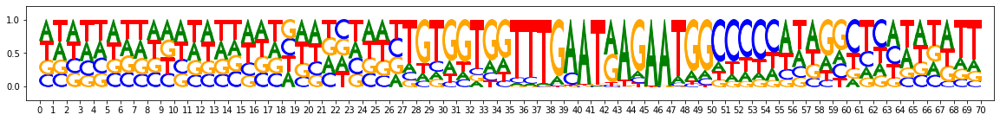

metacluster_0 pattern_11
total seqlets: 267
Task 0 hypothetical scores:


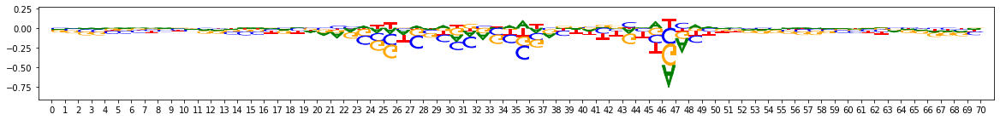

Task 0 actual importance scores:


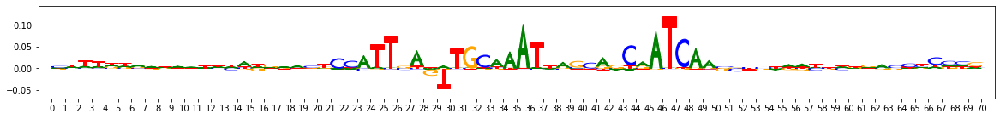

onehot, fwd and rev:


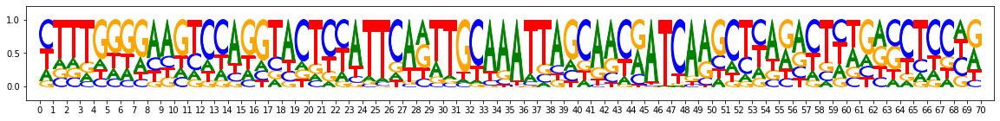

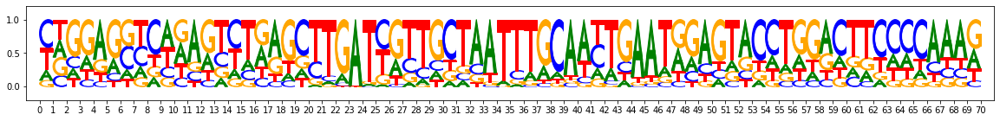

metacluster_0 pattern_12
total seqlets: 213
Task 0 hypothetical scores:


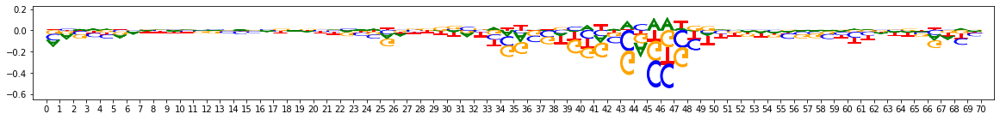

Task 0 actual importance scores:


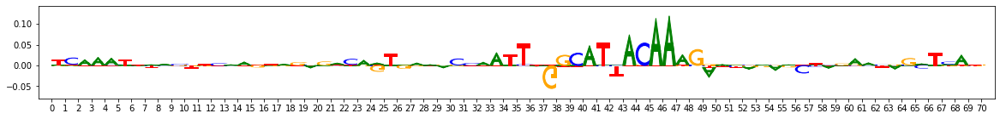

onehot, fwd and rev:


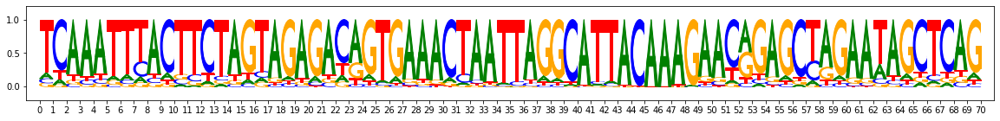

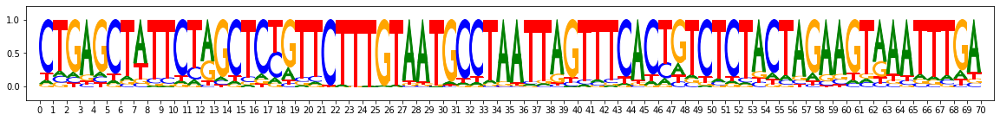

metacluster_0 pattern_13
total seqlets: 272
Task 0 hypothetical scores:


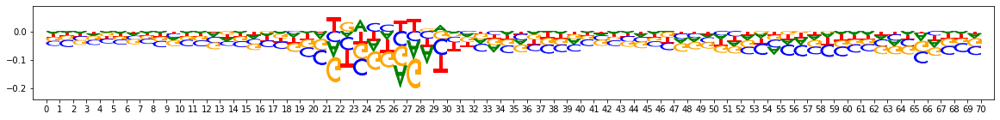

Task 0 actual importance scores:


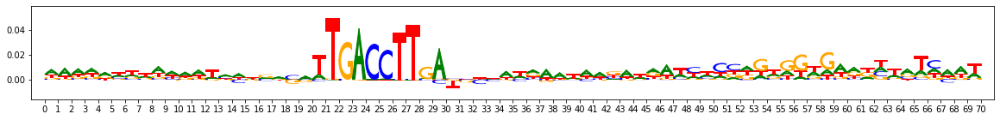

onehot, fwd and rev:


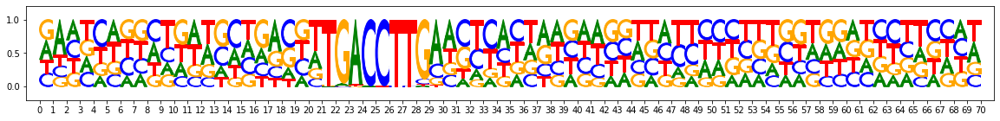

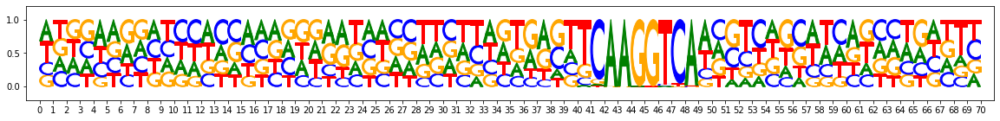

metacluster_0 pattern_14
total seqlets: 165
Task 0 hypothetical scores:


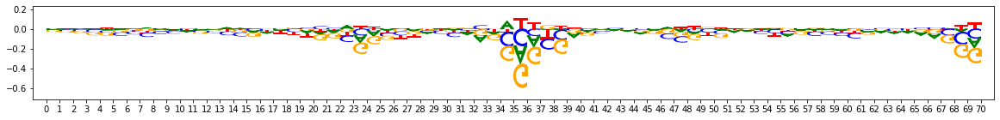

Task 0 actual importance scores:


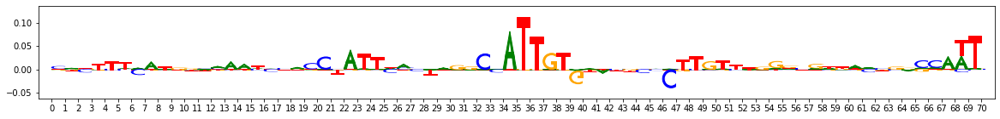

onehot, fwd and rev:


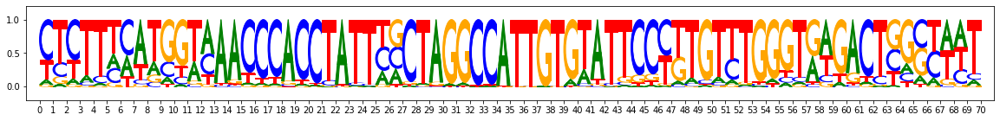

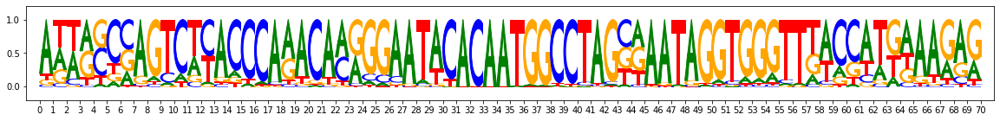

metacluster_0 pattern_15
total seqlets: 206
Task 0 hypothetical scores:


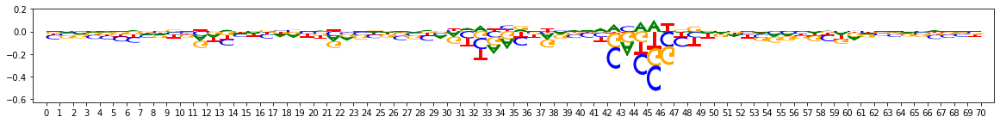

Task 0 actual importance scores:


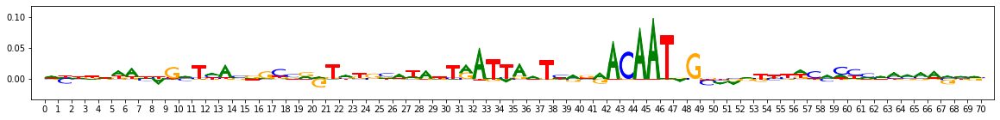

onehot, fwd and rev:


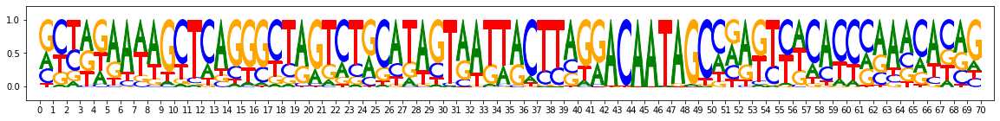

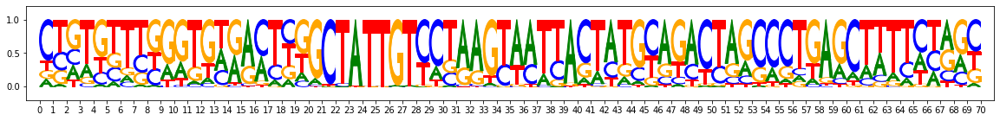

metacluster_0 pattern_16
total seqlets: 113
Task 0 hypothetical scores:


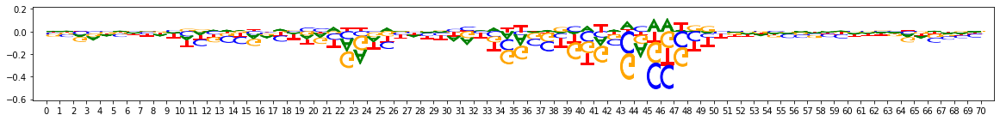

Task 0 actual importance scores:


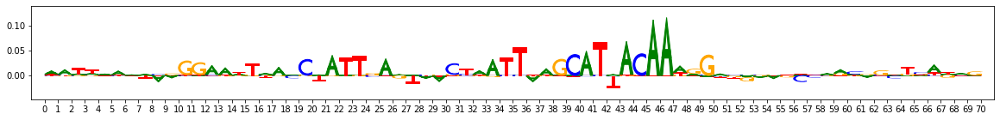

onehot, fwd and rev:


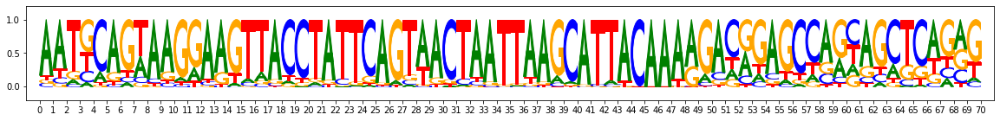

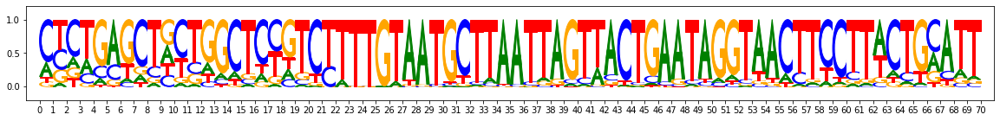

metacluster_0 pattern_17
total seqlets: 105
Task 0 hypothetical scores:


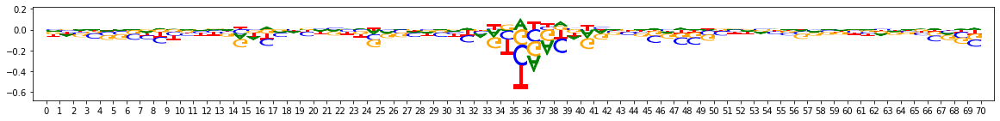

Task 0 actual importance scores:


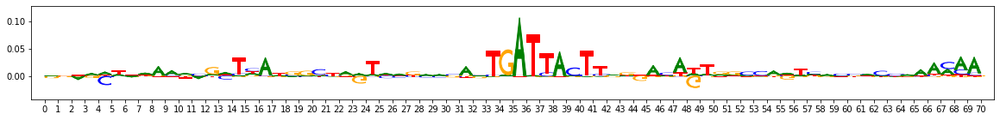

onehot, fwd and rev:


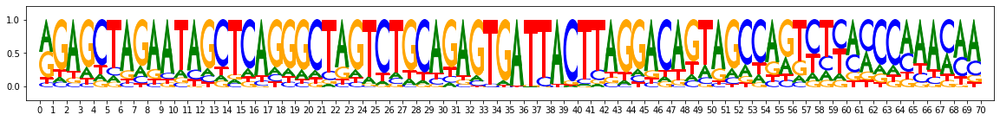

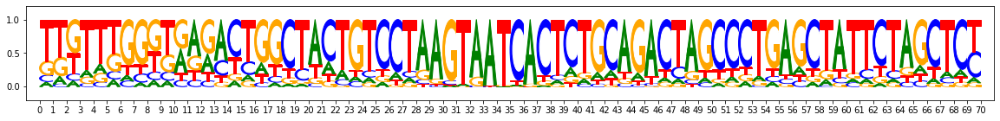

metacluster_0 pattern_18
total seqlets: 101
Task 0 hypothetical scores:


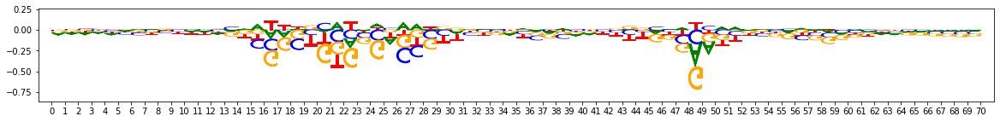

Task 0 actual importance scores:


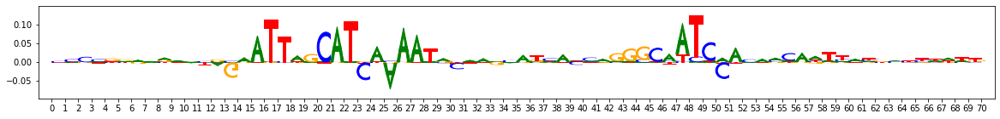

onehot, fwd and rev:


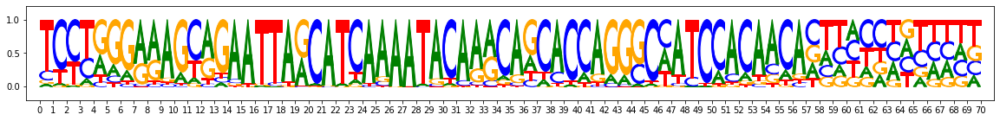

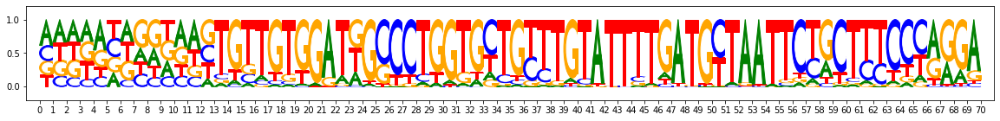

metacluster_0 pattern_19
total seqlets: 82
Task 0 hypothetical scores:


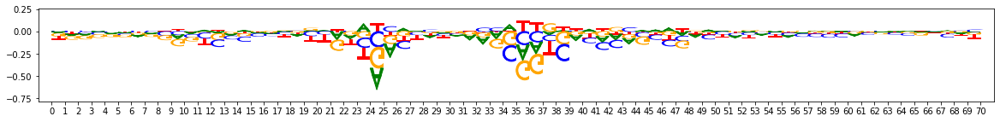

Task 0 actual importance scores:


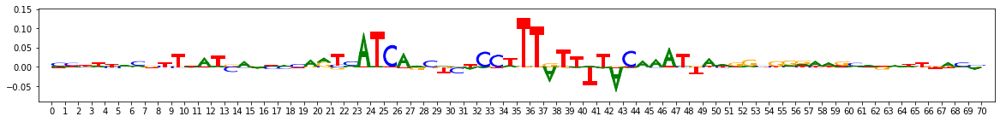

onehot, fwd and rev:


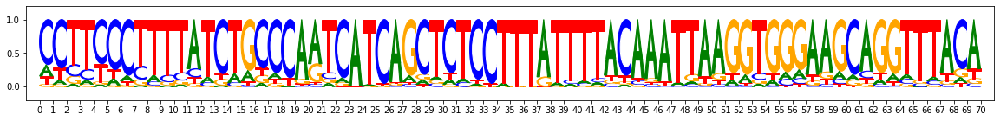

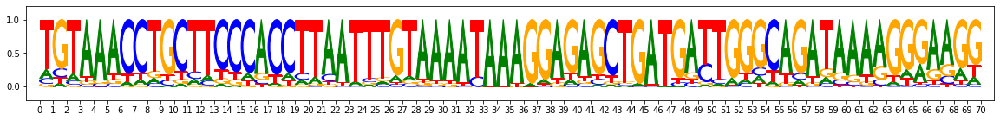

metacluster_0 pattern_20
total seqlets: 112
Task 0 hypothetical scores:


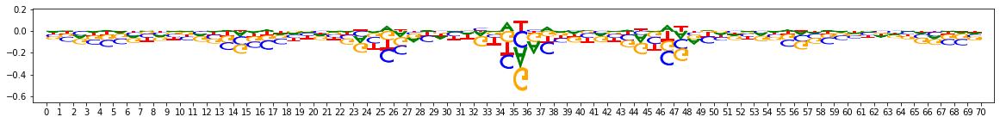

Task 0 actual importance scores:


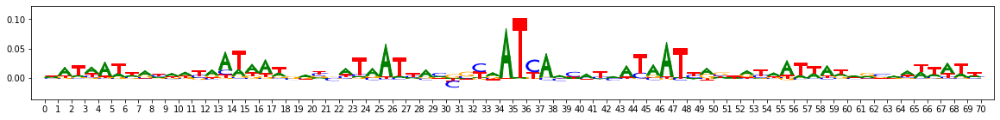

onehot, fwd and rev:


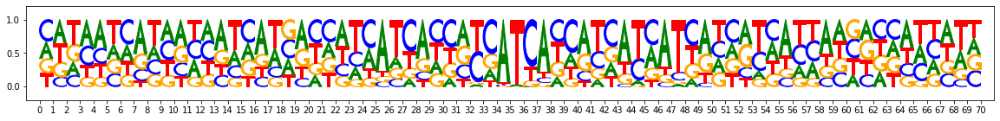

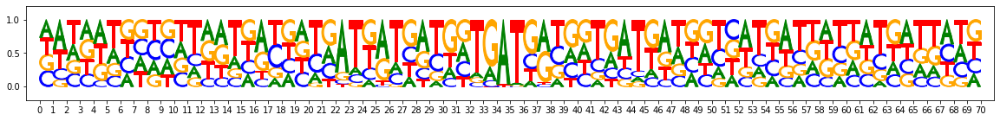

metacluster_0 pattern_21
total seqlets: 86
Task 0 hypothetical scores:


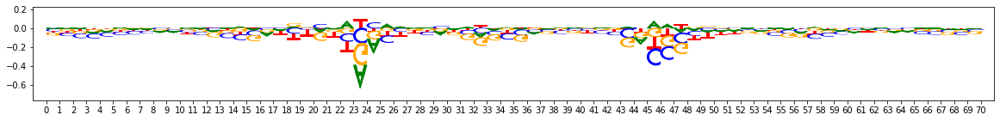

Task 0 actual importance scores:


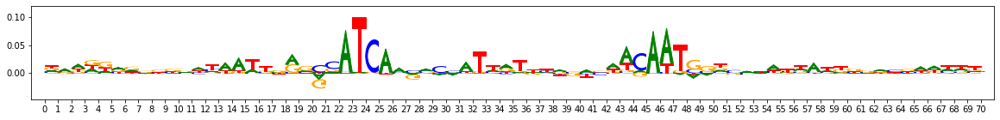

onehot, fwd and rev:


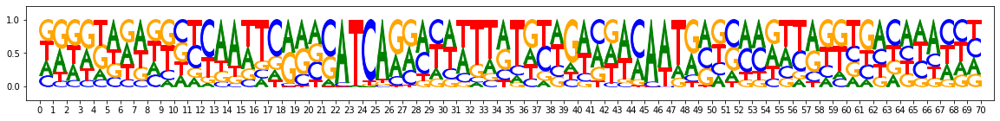

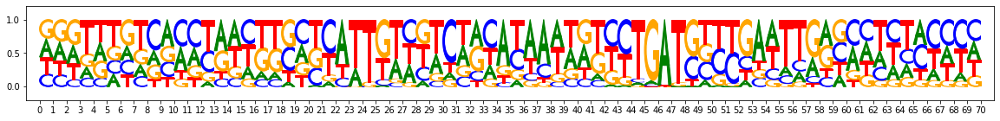

In [11]:
from modisco.visualization import viz_sequence
%matplotlib inline

hdf5_results = h5py.File(file_path,"r")

metacluster_names = [
    x.decode("utf-8") for x in 
    list(hdf5_results["metaclustering_results"]
         ["all_metacluster_names"][:])]

all_patterns = []
background = np.array([0.27, 0.23, 0.23, 0.27])

for metacluster_name in metacluster_names:
    print(metacluster_name)
    metacluster_grp = (hdf5_results["metacluster_idx_to_submetacluster_results"]
                                   [metacluster_name])
    print("activity pattern:",metacluster_grp["activity_pattern"][:])
    all_pattern_names = [x.decode("utf-8") for x in 
                         list(metacluster_grp["seqlets_to_patterns_result"]
                                             ["patterns"]["all_pattern_names"][:])]
    if (len(all_pattern_names)==0):
        print("No motifs found for this activity pattern")
    for pattern_name in all_pattern_names:
        print(metacluster_name, pattern_name)
        all_patterns.append((metacluster_name, pattern_name))
        pattern = metacluster_grp["seqlets_to_patterns_result"]["patterns"][pattern_name]
        print("total seqlets:",len(pattern["seqlets_and_alnmts"]["seqlets"]))
        print("Task 0 hypothetical scores:")
        viz_sequence.plot_weights(pattern["Nanog_profile_wn_hypothetical_contribs"]["fwd"])
        print("Task 0 actual importance scores:")
        viz_sequence.plot_weights(pattern["Nanog_profile_wn_contrib_scores"]["fwd"])
        print("onehot, fwd and rev:")
        viz_sequence.plot_weights(np.array(pattern["sequence"]["fwd"])) 
        viz_sequence.plot_weights(np.array(pattern["sequence"]["rev"])) 
        
hdf5_results.close()

MEME-DISco motif number 0
num seqlets: 9854


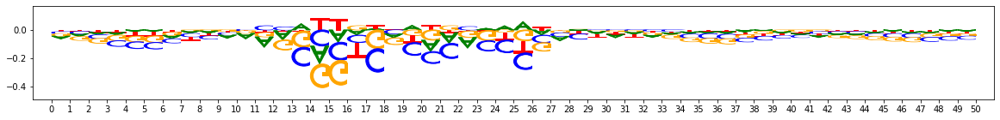

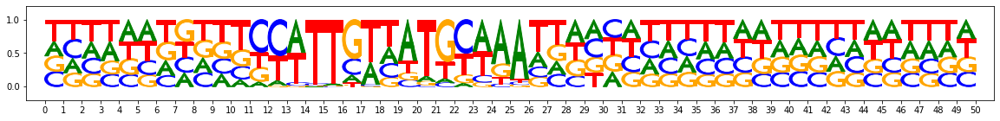

MEME-DISco motif number 1
num seqlets: 8597


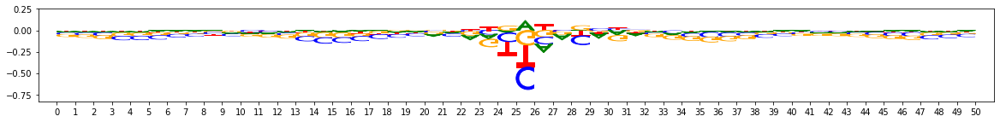

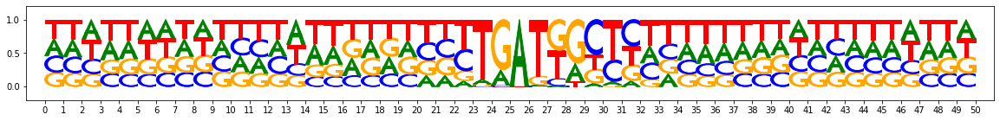

MEME-DISco motif number 2
num seqlets: 7200


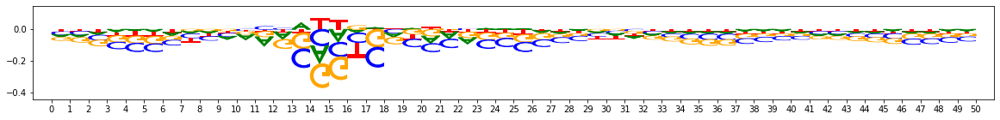

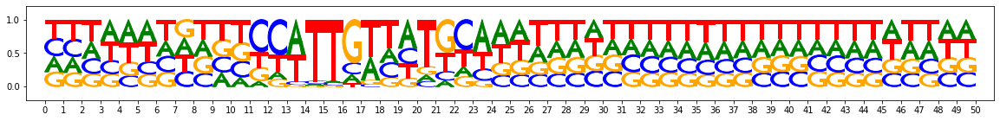

MEME-DISco motif number 3
num seqlets: 5887


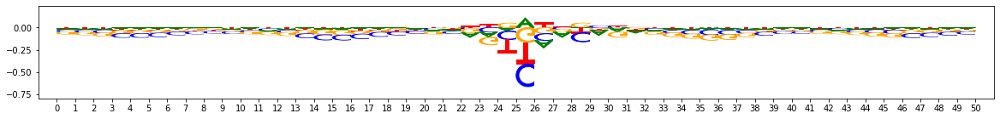

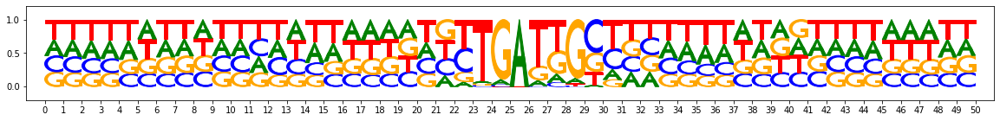

MEME-DISco motif number 4
num seqlets: 4735


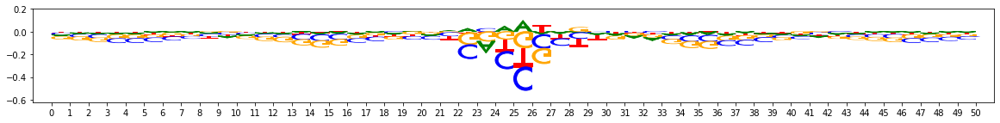

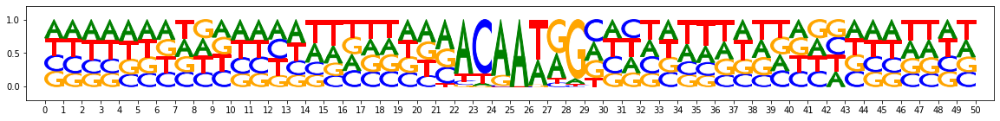

MEME-DISco motif number 5
num seqlets: 3469


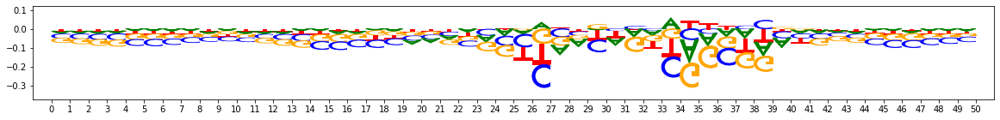

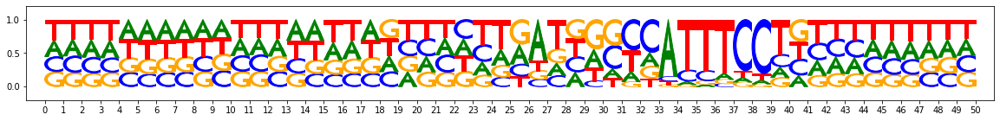

MEME-DISco motif number 6
num seqlets: 2024


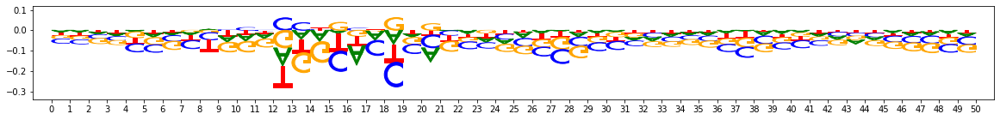

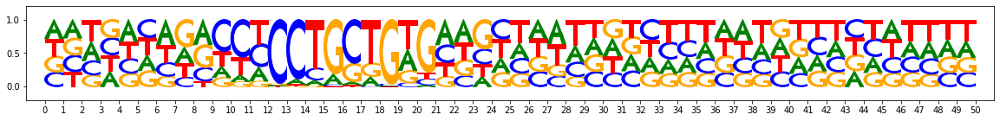

MEME-DISco motif number 7
num seqlets: 1799


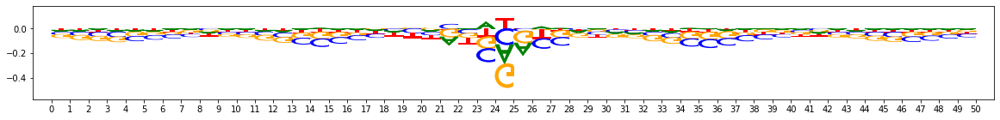

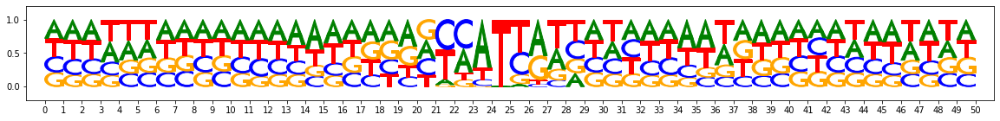

MEME-DISco motif number 8
num seqlets: 1826


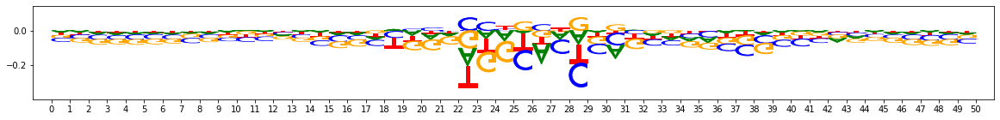

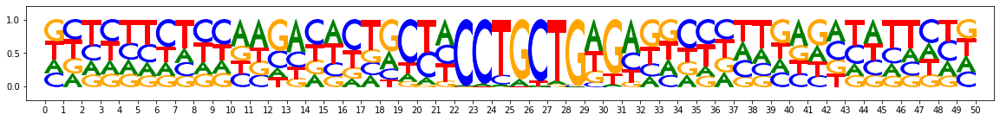

MEME-DISco motif number 9
num seqlets: 208


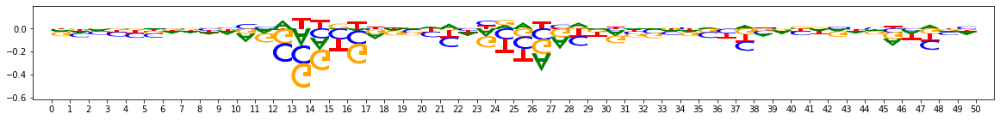

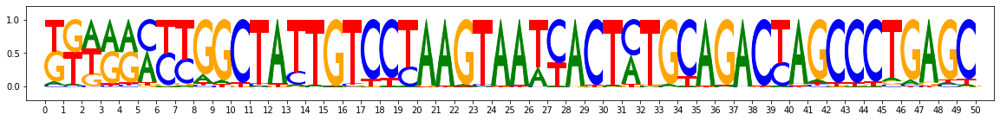

MEME-DISco motif number 10
num seqlets: 210


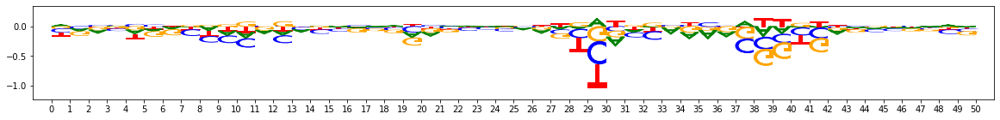

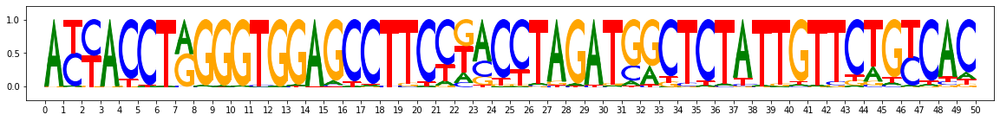

MEME-DISco motif number 11
num seqlets: 124


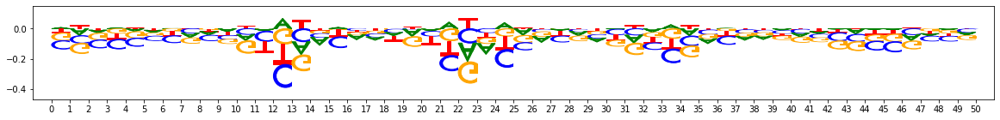

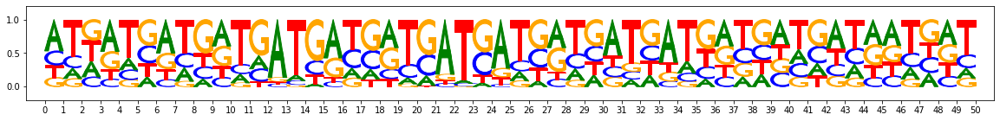

MEME-DISco motif number 12
num seqlets: 108


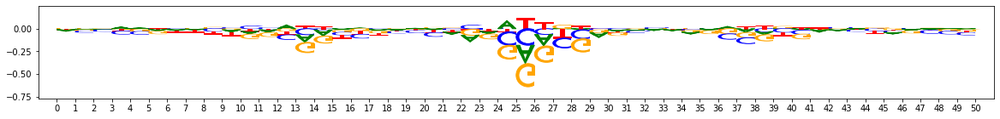

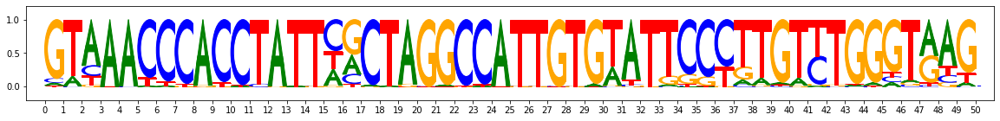

MEME-DISco motif number 13
num seqlets: 63


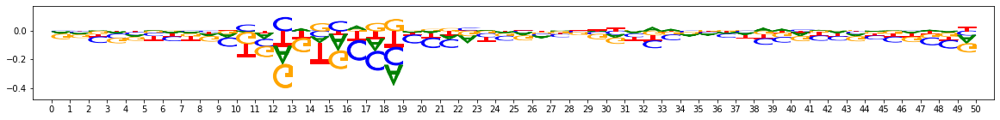

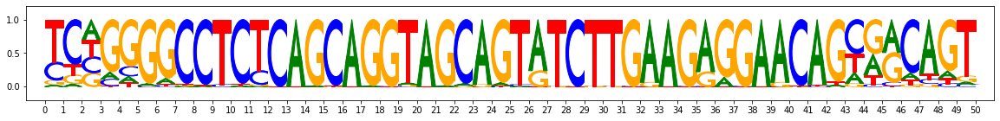

MEME-DISco motif number 14
num seqlets: 70


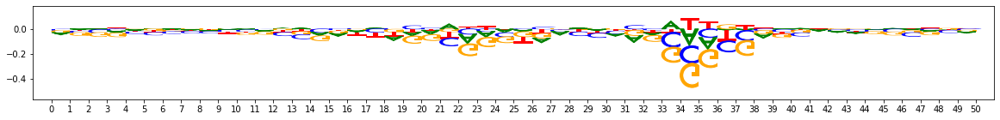

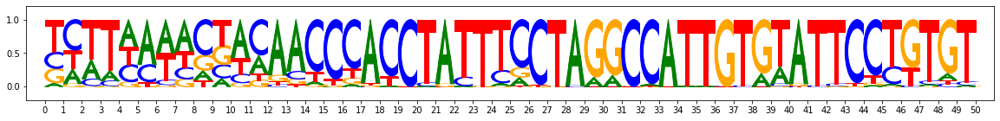

MEME-DISco motif number 15
num seqlets: 71


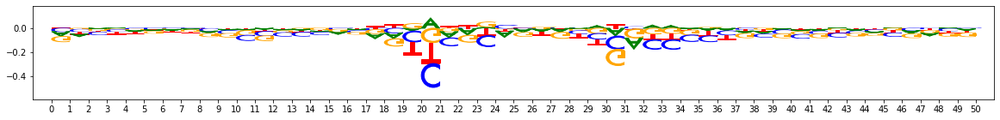

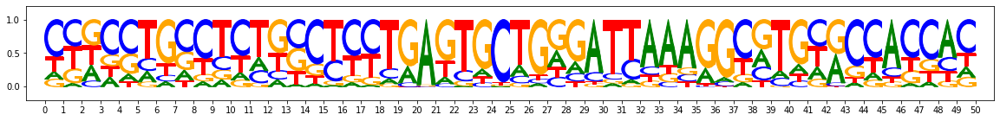

MEME-DISco motif number 16
num seqlets: 45


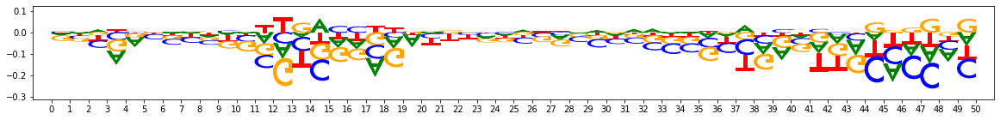

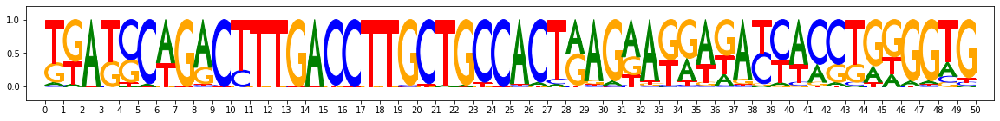

In [12]:
from modisco.visualization import viz_sequence
meme_discovered_motifs = (results
    .metacluster_idx_to_submetacluster_results[0].seqlets_to_patterns_result
    .each_round_initcluster_motifs[0])
for idx,motif in enumerate(meme_discovered_motifs):
    print("MEME-DISco motif number",idx)
    print("num seqlets:",len(motif.seqlets))
    viz_sequence.plot_weights(motif["Nanog_profile_wn_hypothetical_contribs"].fwd)
    viz_sequence.plot_weights(motif["sequence"].fwd)

MEME-DISco motif number 0
num seqlets: 3304


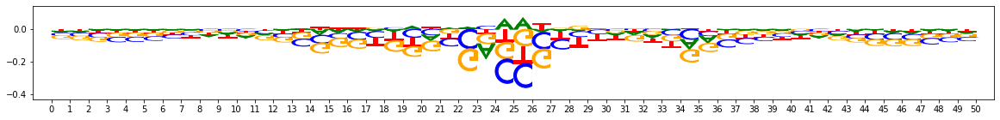

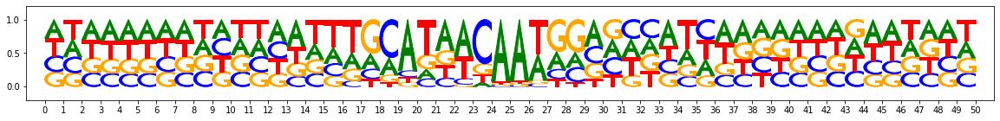

MEME-DISco motif number 1
num seqlets: 2997


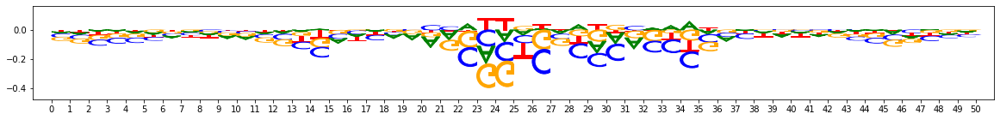

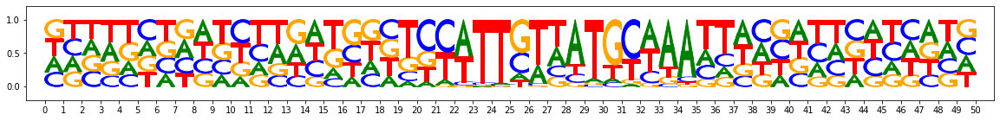

MEME-DISco motif number 2
num seqlets: 2311


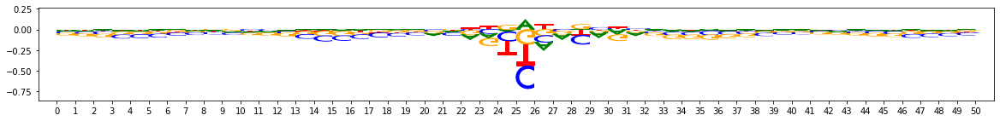

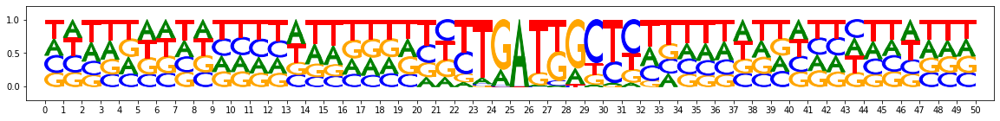

MEME-DISco motif number 3
num seqlets: 2295


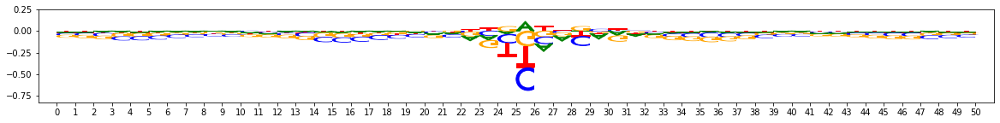

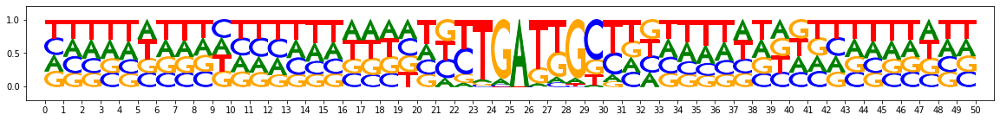

MEME-DISco motif number 4
num seqlets: 1756


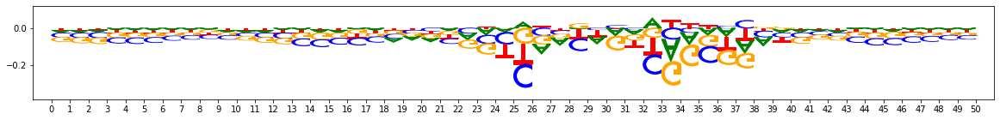

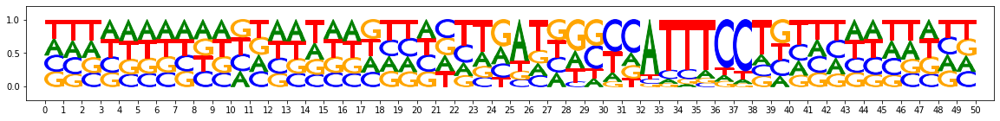

MEME-DISco motif number 5
num seqlets: 1654


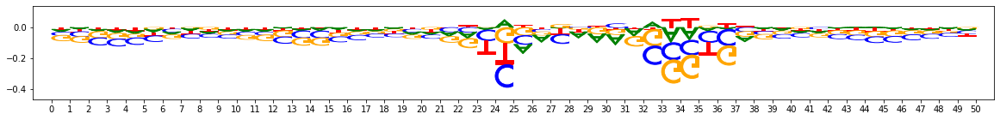

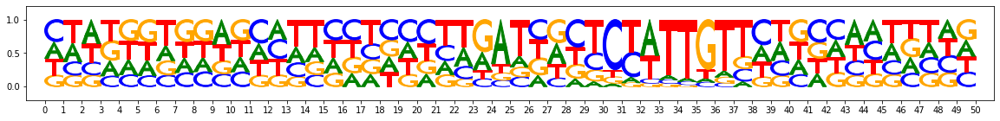

MEME-DISco motif number 6
num seqlets: 906


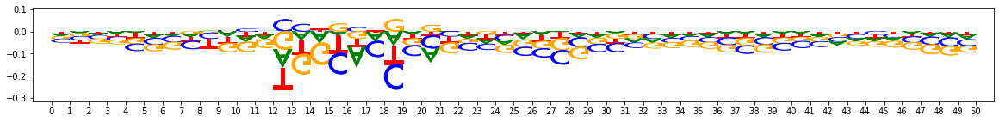

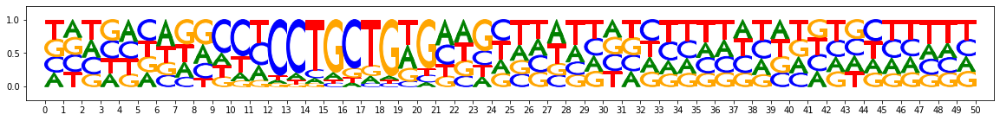

MEME-DISco motif number 7
num seqlets: 823


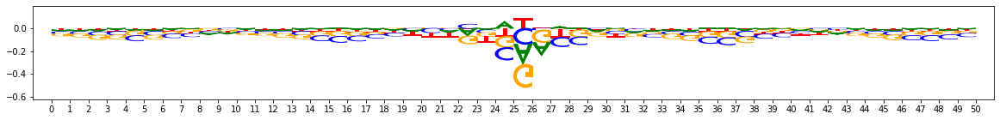

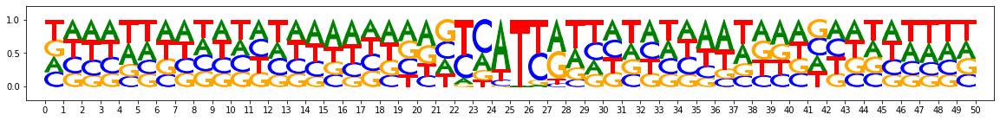

MEME-DISco motif number 8
num seqlets: 692


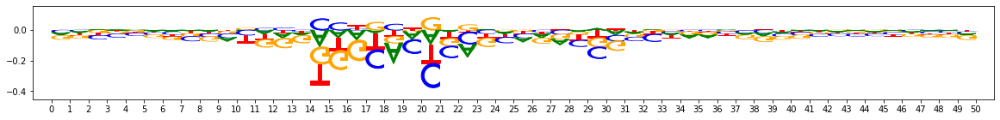

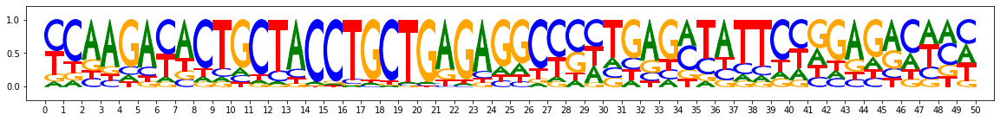

MEME-DISco motif number 9
num seqlets: 219


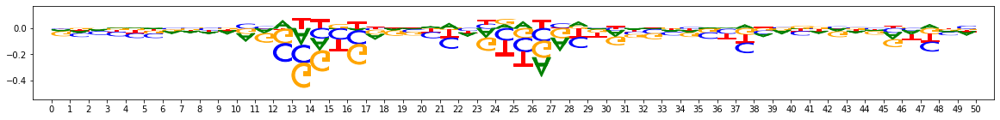

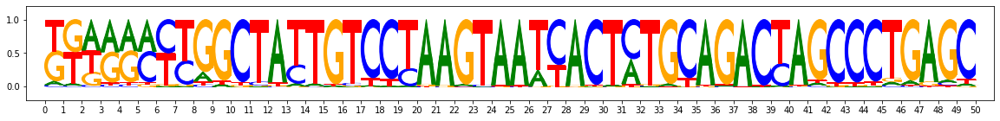

MEME-DISco motif number 10
num seqlets: 153


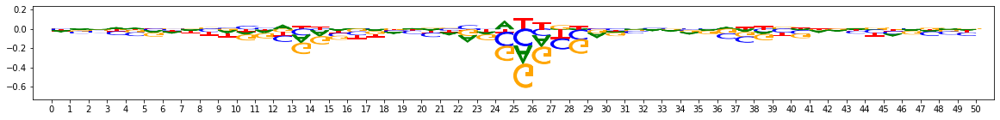

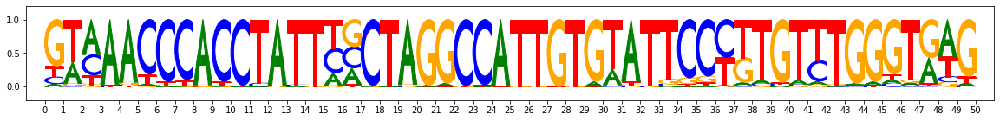

MEME-DISco motif number 11
num seqlets: 60


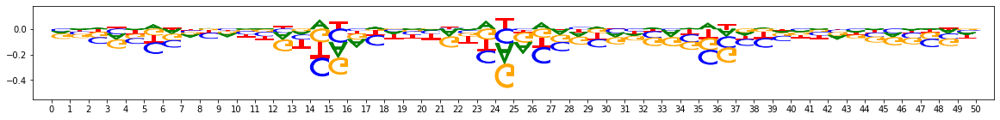

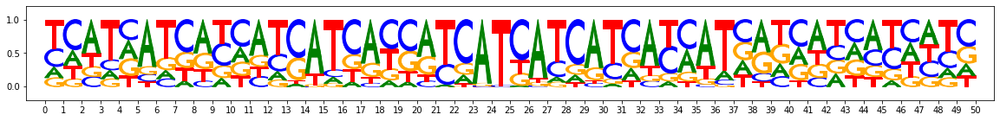

MEME-DISco motif number 12
num seqlets: 15


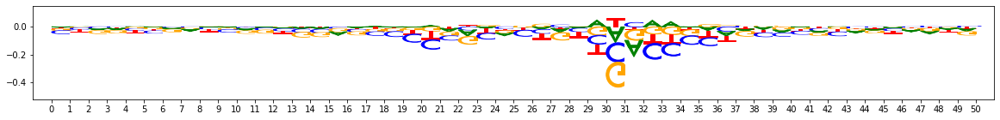

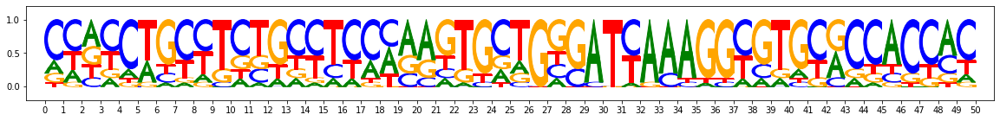

MEME-DISco motif number 13
num seqlets: 14


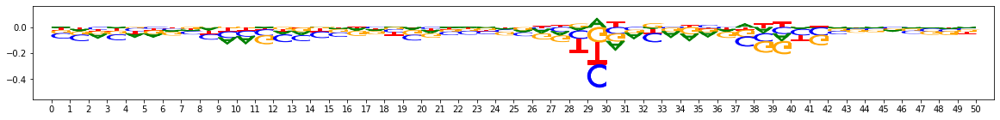

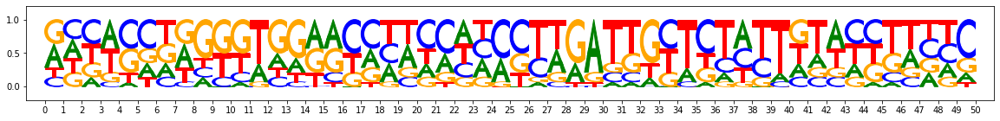

MEME-DISco motif number 14
num seqlets: 7


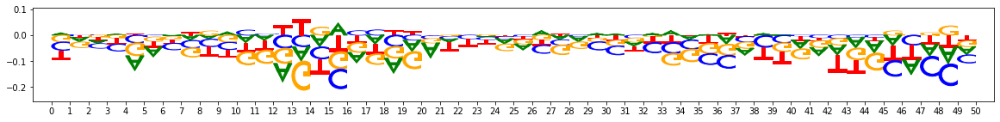

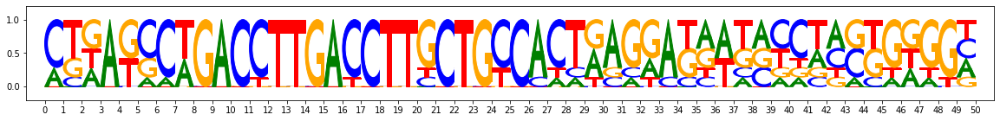

In [13]:
from modisco.visualization import viz_sequence
meme_discovered_motifs = (results
    .metacluster_idx_to_submetacluster_results[0].seqlets_to_patterns_result
    .each_round_initcluster_motifs[1])
for idx,motif in enumerate(meme_discovered_motifs):
    print("MEME-DISco motif number",idx)
    print("num seqlets:",len(motif.seqlets))
    viz_sequence.plot_weights(motif["Nanog_profile_wn_hypothetical_contribs"].fwd)
    viz_sequence.plot_weights(motif["sequence"].fwd)